In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import rcParams
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
import matplotlib.cm as cm
from matplotlib.colors import Normalize

In [2]:
# data loading

act_path = os.getcwd()
weights = np.zeros((96,78))
delay = np.zeros((96,78))
fitness= np.zeros((96))
range_weights = 20.
range_delay = np.array([1.,10.])
range_fitness = 10000.

for data_number in range(96):
    file_name = "individual_99_" + str(data_number) + "_result.csv"
    data_path = os.path.join(act_path, "csv_files_data1", file_name)
    df = pd.read_csv(data_path, delimiter=',', header=None)
    df = df.to_numpy()
    weights[data_number,:] = df[0,:]
    delay[data_number,:] = df[1,:]
    fitness[data_number] = df[2,0] 
    
fit_mean = np.mean(fitness) # to do: min, max, mean, standerd dev.
# print(fit_mean)

# numpy arrays
weights = np.clip(weights, -20., 20.)
delay = np.clip(delay, 1., 10.)
fitness = np.clip(fitness, -10000., 10000.)

# data frames for all indiviuals together
weights_df = pd.DataFrame(weights)
delay_df = pd.DataFrame(delay)
fitness_df = pd.DataFrame(fitness)

# data frames for each individual (weights + delay)
df_list = []
weights_delay = np.zeros((78,2))
for data_number in range(96):
    weights_delay[:,0] = weights[data_number, :]
    weights_delay[:,1] = delay[data_number, :]
    df_list.append(pd.DataFrame(weights_delay))


In [3]:
# mean delay and weights

'''
Extract the mean weights of the three different
connection types of the network (layer 1 to layer 2, within layer 2, layer 2 to layer 3; see Fig. 1a) and
plot them in an analogous manner to the PCA plot.
'''
# layer 1 to layer 2: 6x6=36 weights
# within layer 2: 5x6 = 30 weights
# layer 2 to layer 3: 6x2 = 12 weights
weights1 = weights[:,0:35]
weights2 = weights[:,36:65]
weights3 = weights[:,65:77]
delay1 = delay[:,0:35]
delay2 = delay[:,36:65]
delay3 = delay[:,65:77]
mean_weights1=np.zeros((weights.shape[0]))
mean_weights2=np.zeros((weights.shape[0]))
mean_weights3=np.zeros((weights.shape[0]))
mean_delay1=np.zeros((delay.shape[0]))
mean_delay2=np.zeros((delay.shape[0]))
mean_delay3=np.zeros((delay.shape[0]))

for data_number in range(weights.shape[0]):
    mean_weights1[data_number] = np.mean(weights1[data_number,:])
    mean_weights2[data_number] = np.mean(weights2[data_number,:])
    mean_weights3[data_number] = np.mean(weights3[data_number,:])
    mean_delay1[data_number] = np.mean(delay1[data_number,:])
    mean_delay2[data_number] = np.mean(delay2[data_number,:])
    mean_delay3[data_number] = np.mean(delay3[data_number,:])


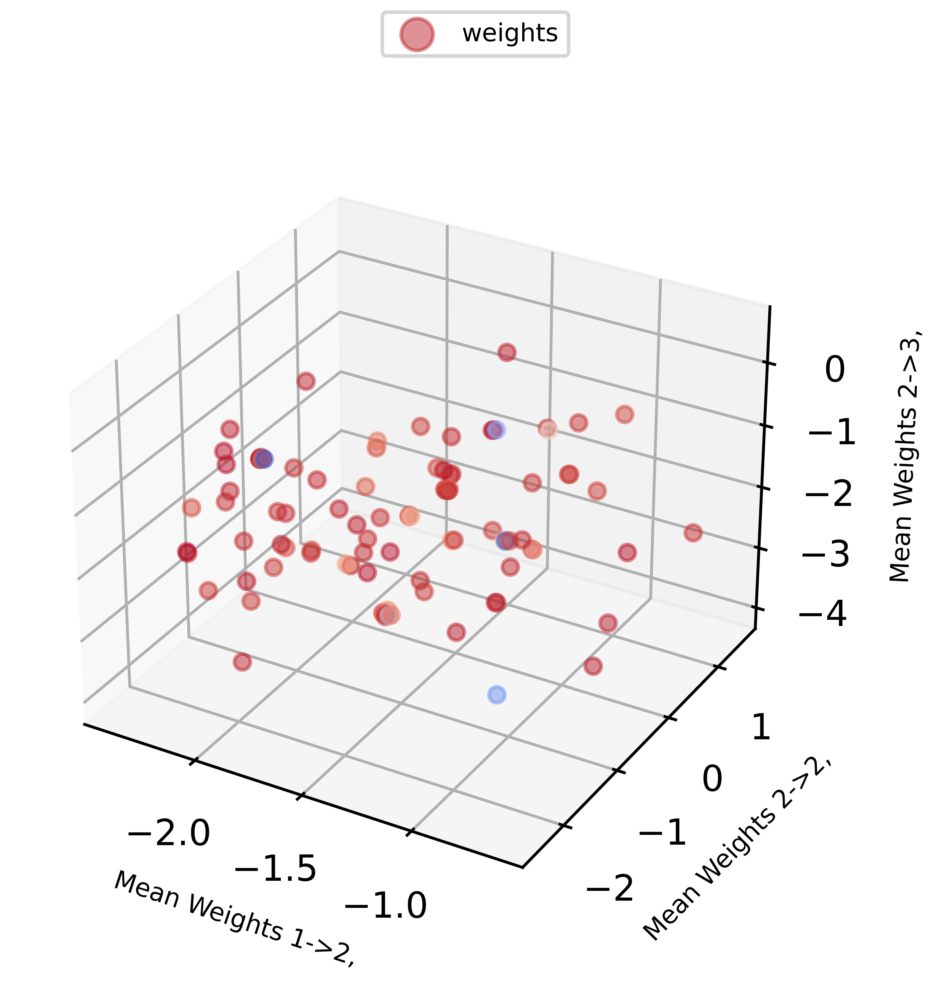

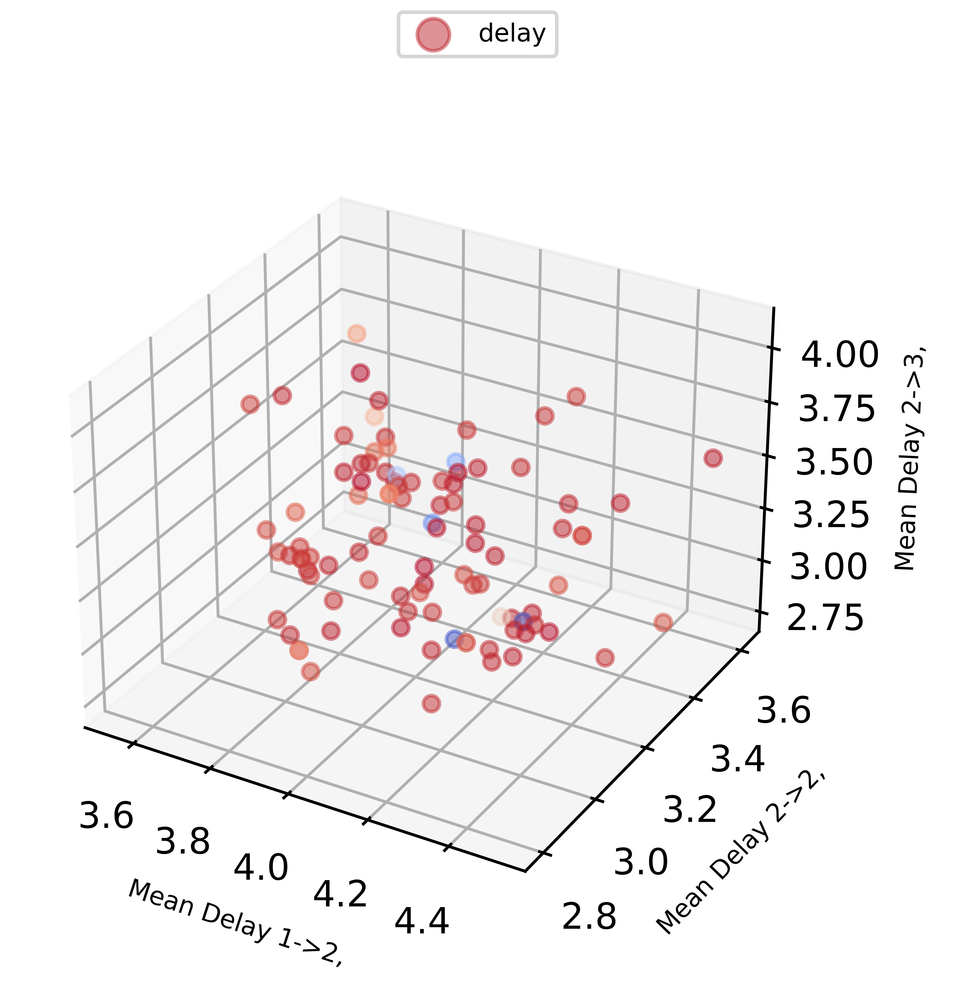

In [6]:
# plot mean weights

fig = plt.figure(1)
ax = fig.add_subplot(111, projection='3d')

colors = fitness.astype(int)
ax.scatter(mean_weights1, mean_weights2, mean_weights3, c=colors, cmap = 'coolwarm', alpha=0.5, label='weights')

# We will then label the three axes using the percentages explained for each major component.
ax.set_xlabel('Mean Weights 1->2, ', fontsize=7)
ax.set_ylabel('Mean Weights 2->2, ', fontsize=7)
ax.set_zlabel('Mean Weights 2->3, ', fontsize=7)


fig.legend(fontsize = 'x-small', loc='upper center', markerscale=2)
plt.autoscale()
plt.rcParams["figure.dpi"] = 1000                                   # set the figure resolution dpi value to 1000
plt.show()

fig_name = 'mean_weights.png'
fig.savefig(fig_name)


# plot mean delay

fig2 = plt.figure(2)
ax = fig2.add_subplot(111, projection='3d')

colors = fitness.astype(int)
ax.scatter(mean_delay1, mean_delay2, mean_delay3, c=colors, cmap = 'coolwarm', alpha=0.5, label='delay')


# We will then label the three axes using the percentages explained for each major component.
ax.set_xlabel('Mean Delay 1->2, ', fontsize=7)
ax.set_ylabel('Mean Delay 2->2, ', fontsize=7)
ax.set_zlabel('Mean Delay 2->3, ', fontsize=7)


fig2.legend(fontsize = 'x-small', loc='upper center', markerscale=2)
plt.autoscale()
plt.rcParams["figure.dpi"] = 1000                                   # set the figure resolution dpi value to 1000
plt.show()

fig2_name = 'mean_delay.png'
fig2.savefig(fig2_name)

In [7]:
# mean delay and weights - absolute values

'''
Extract the mean weights of the three different
connection types of the network (layer 1 to layer 2, within layer 2, layer 2 to layer 3; see Fig. 1a) and
plot them in an analogous manner to the PCA plot.
'''
# layer 1 to layer 2: 6x6=36 weights
# within layer 2: 5x6 = 30 weights
# layer 2 to layer 3: 6x2 = 12 weights
weights1 = np.absolute(weights[:,0:35])
weights2 = np.absolute(weights[:,36:65])
weights3 = np.absolute(weights[:,65:77])
delay1 = np.absolute(delay[:,0:35])
delay2 = np.absolute(delay[:,36:65])
delay3 = np.absolute(delay[:,65:77])
mean_weights1=np.zeros((weights.shape[0]))
mean_weights2=np.zeros((weights.shape[0]))
mean_weights3=np.zeros((weights.shape[0]))
mean_delay1=np.zeros((delay.shape[0]))
mean_delay2=np.zeros((delay.shape[0]))
mean_delay3=np.zeros((delay.shape[0]))

for data_number in range(weights.shape[0]):
    mean_weights1[data_number] = np.mean(weights1[data_number,:])
    mean_weights2[data_number] = np.mean(weights2[data_number,:])
    mean_weights3[data_number] = np.mean(weights3[data_number,:])
    mean_delay1[data_number] = np.mean(delay1[data_number,:])
    mean_delay2[data_number] = np.mean(delay2[data_number,:])
    mean_delay3[data_number] = np.mean(delay3[data_number,:])

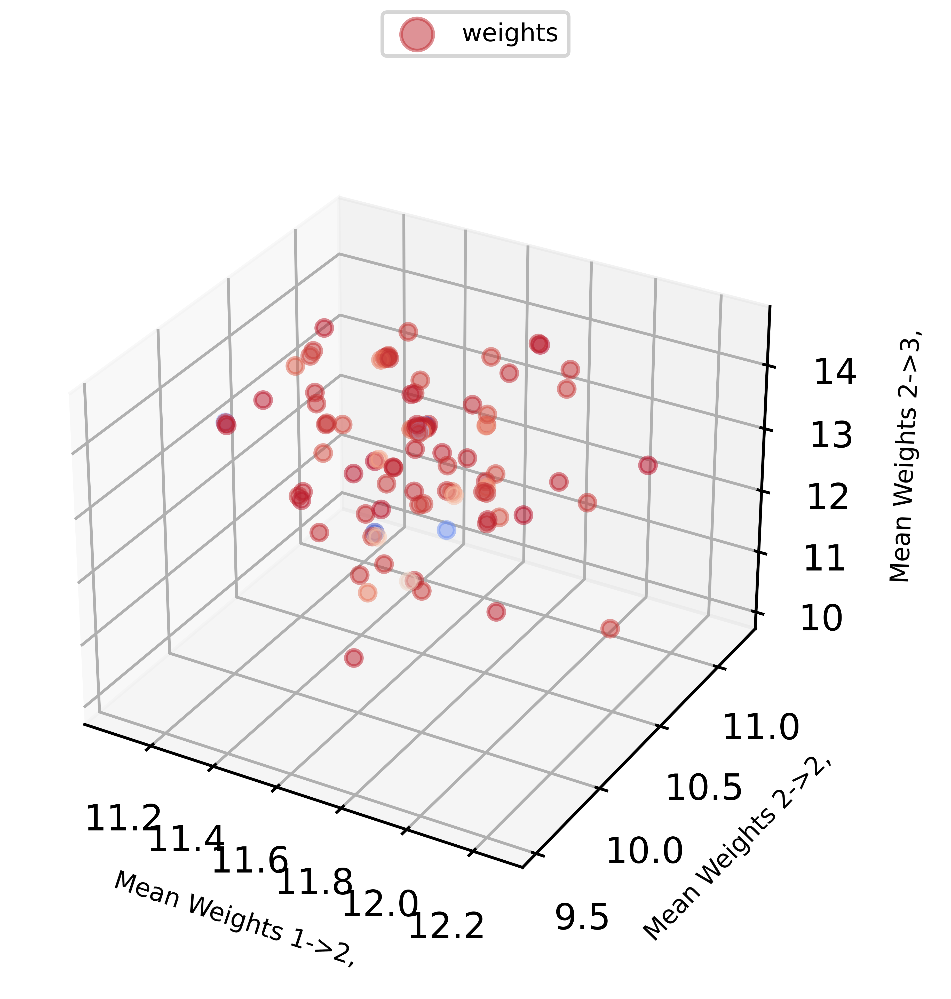

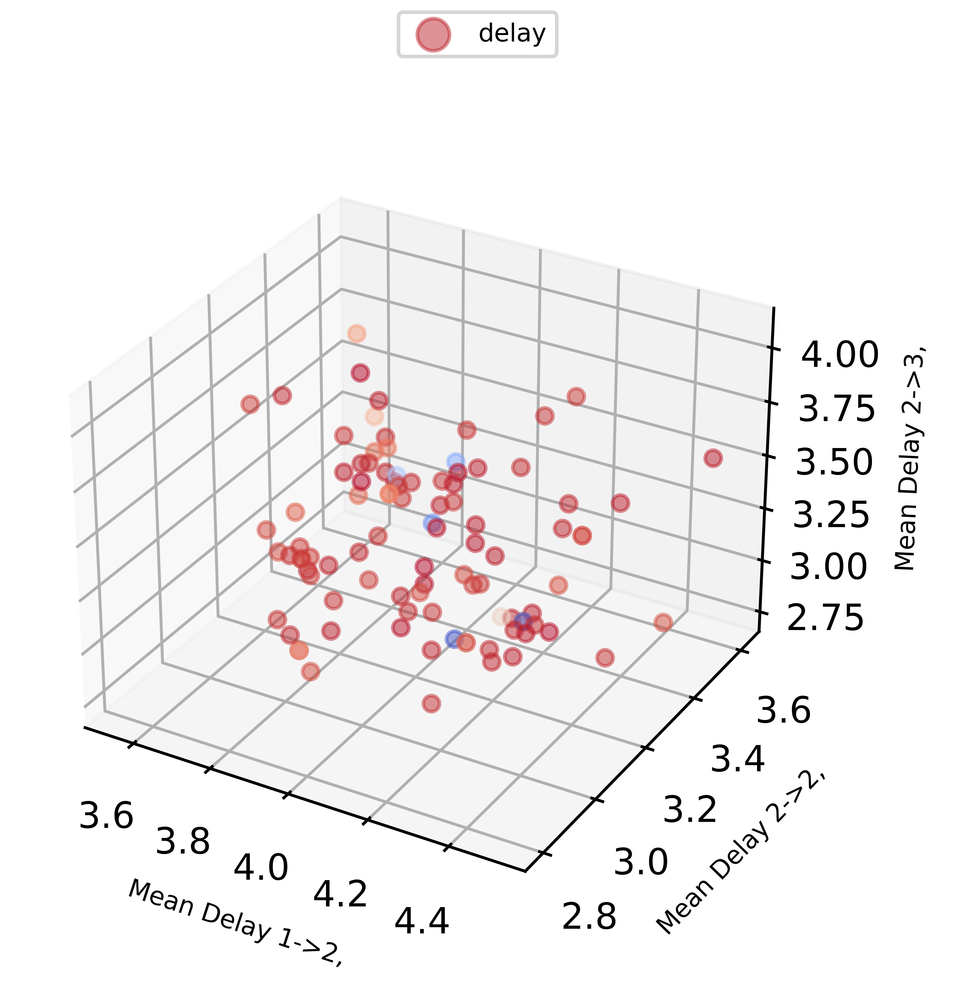

In [8]:
# plot mean absolute weights/delay

fig = plt.figure(1)
ax = fig.add_subplot(111, projection='3d')

colors = fitness.astype(int)
ax.scatter(mean_weights1, mean_weights2, mean_weights3, c=colors, cmap = 'coolwarm', alpha=0.5, label='weights')


# We will then label the three axes using the percentages explained for each major component.
ax.set_xlabel('Mean Weights 1->2, ', fontsize=7)
ax.set_ylabel('Mean Weights 2->2, ', fontsize=7)
ax.set_zlabel('Mean Weights 2->3, ', fontsize=7)


fig.legend(fontsize = 'x-small', loc='upper center', markerscale=2)
plt.autoscale()
plt.rcParams["figure.dpi"] = 1000                                   # set the figure resolution dpi value to 1000
plt.show()

fig_name = 'mean_absolute_weights.png'
fig.savefig(fig_name)


# plot mean absolute weights/delay

fig2 = plt.figure(2)
ax = fig2.add_subplot(111, projection='3d')

colors = fitness.astype(int)
ax.scatter(mean_delay1, mean_delay2, mean_delay3, c=colors, cmap = 'coolwarm', alpha=0.5, label='delay')


# We will then label the three axes using the percentages explained for each major component.
ax.set_xlabel('Mean Delay 1->2, ', fontsize=7)
ax.set_ylabel('Mean Delay 2->2, ', fontsize=7)
ax.set_zlabel('Mean Delay 2->3, ', fontsize=7)


fig2.legend(fontsize = 'x-small', loc='upper center', markerscale=2)
plt.autoscale()
plt.rcParams["figure.dpi"] = 1000                                   # set the figure resolution dpi value to 1000
plt.show()

fig2_name = 'mean_absolute_delay.png'
fig2.savefig(fig2_name)

In [11]:
# median delay and weights

'''
Extract the mean weights of the three different
connection types of the network (layer 1 to layer 2, within layer 2, layer 2 to layer 3; see Fig. 1a) and
plot them in an analogous manner to the PCA plot.
'''
# layer 1 to layer 2: 6x6=36 weights
# within layer 2: 5x6 = 30 weights
# layer 2 to layer 3: 6x2 = 12 weights
weights1 = weights[:,0:35]
weights2 = weights[:,36:65]
weights3 = weights[:,65:77]
delay1 = delay[:,0:35]
delay2 = delay[:,36:65]
delay3 = delay[:,65:77]
median_weights1=np.zeros((weights.shape[0]))
median_weights2=np.zeros((weights.shape[0]))
median_weights3=np.zeros((weights.shape[0]))
median_delay1=np.zeros((delay.shape[0]))
median_delay2=np.zeros((delay.shape[0]))
median_delay3=np.zeros((delay.shape[0]))

for data_number in range(weights.shape[0]):
    median_weights1[data_number] = np.median(weights1[data_number,:])
    median_weights2[data_number] = np.median(weights2[data_number,:])
    median_weights3[data_number] = np.median(weights3[data_number,:])
    median_delay1[data_number] = np.median(delay1[data_number,:])
    median_delay2[data_number] = np.median(delay2[data_number,:])
    median_delay3[data_number] = np.median(delay3[data_number,:])

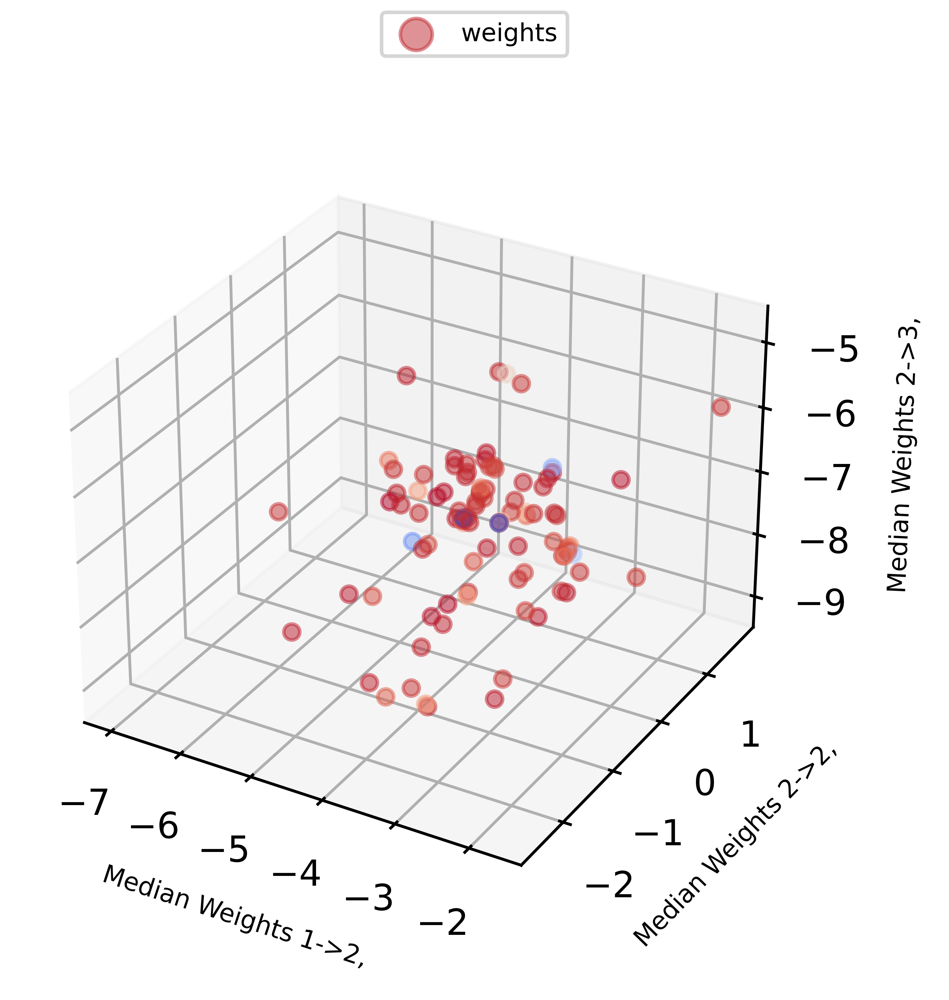

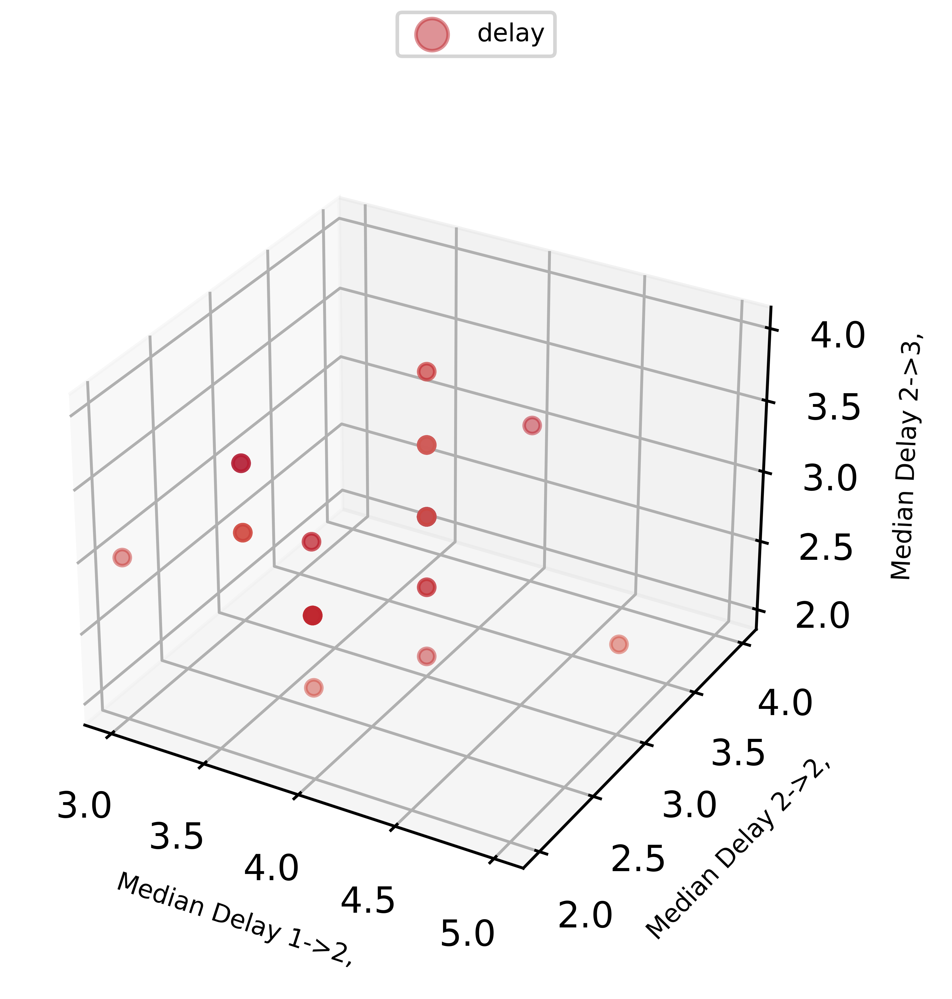

In [12]:
# plot median weights

fig = plt.figure(1)
ax = fig.add_subplot(111, projection='3d')

colors = fitness.astype(int)
ax.scatter(median_weights1, median_weights2, median_weights3, c=colors, cmap = 'coolwarm', alpha=0.5, label='weights')


# We will then label the three axes using the percentages explained for each major component.
ax.set_xlabel('Median Weights 1->2, ', fontsize=7)
ax.set_ylabel('Median Weights 2->2, ', fontsize=7)
ax.set_zlabel('Median Weights 2->3, ', fontsize=7)


fig.legend(fontsize = 'x-small', loc='upper center', markerscale=2)
plt.autoscale()
plt.rcParams["figure.dpi"] = 1000                                   # set the figure resolution dpi value to 1000
plt.show()

fig_name = 'median_weights.png'
fig.savefig(fig_name)

# plot median weights/delay

fig2 = plt.figure(2)
ax = fig2.add_subplot(111, projection='3d')

colors = fitness.astype(int)
ax.scatter(median_delay1, median_delay2, median_delay3, c=colors, cmap = 'coolwarm', alpha=0.5, label='delay')


# We will then label the three axes using the percentages explained for each major component.
ax.set_xlabel('Median Delay 1->2, ', fontsize=7)
ax.set_ylabel('Median Delay 2->2, ', fontsize=7)
ax.set_zlabel('Median Delay 2->3, ', fontsize=7)


fig2.legend(fontsize = 'x-small', loc='upper center', markerscale=2)
plt.autoscale()
plt.rcParams["figure.dpi"] = 1000                                   # set the figure resolution dpi value to 1000
plt.show()

fig2_name = 'median_delay.png'
fig2.savefig(fig2_name)

In [14]:
# median delay and weights - absolute

'''
Extract the mean weights of the three different
connection types of the network (layer 1 to layer 2, within layer 2, layer 2 to layer 3; see Fig. 1a) and
plot them in an analogous manner to the PCA plot.
'''
# layer 1 to layer 2: 6x6=36 weights
# within layer 2: 5x6 = 30 weights
# layer 2 to layer 3: 6x2 = 12 weights
weights1 = np.absolute(weights[:,0:35])
weights2 = np.absolute(weights[:,36:65])
weights3 = np.absolute(weights[:,65:77])
delay1 = np.absolute(delay[:,0:35])
delay2 = np.absolute(delay[:,36:65])
delay3 = np.absolute(delay[:,65:77])
median_weights1=np.zeros((weights.shape[0]))
median_weights2=np.zeros((weights.shape[0]))
median_weights3=np.zeros((weights.shape[0]))
median_delay1=np.zeros((delay.shape[0]))
median_delay2=np.zeros((delay.shape[0]))
median_delay3=np.zeros((delay.shape[0]))

for data_number in range(weights.shape[0]):
    median_weights1[data_number] = np.median(weights1[data_number,:])
    median_weights2[data_number] = np.median(weights2[data_number,:])
    median_weights3[data_number] = np.median(weights3[data_number,:])
    median_delay1[data_number] = np.median(delay1[data_number,:])
    median_delay2[data_number] = np.median(delay2[data_number,:])
    median_delay3[data_number] = np.median(delay3[data_number,:])

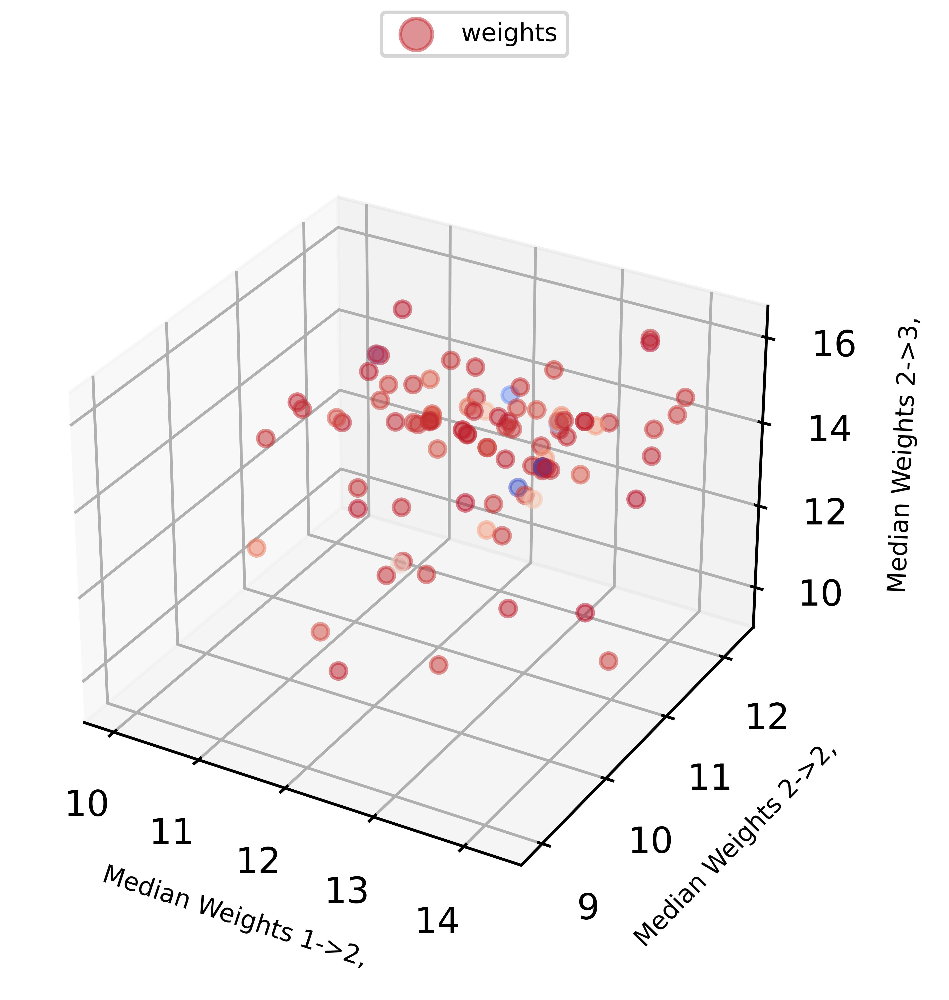

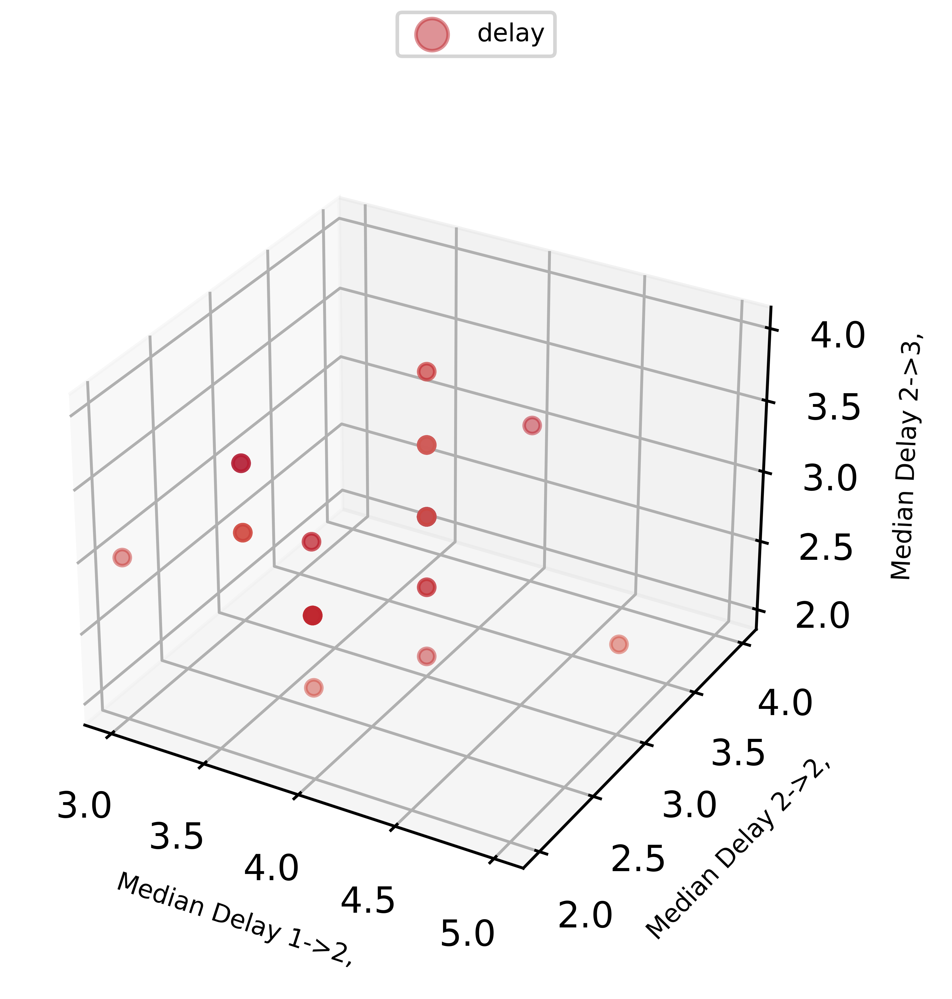

In [15]:
# plot median weights - absolute

fig = plt.figure(1)
ax = fig.add_subplot(111, projection='3d')

colors = fitness.astype(int)
ax.scatter(median_weights1, median_weights2, median_weights3, c=colors, cmap = 'coolwarm', alpha=0.5, label='weights')


# We will then label the three axes using the percentages explained for each major component.
ax.set_xlabel('Median Weights 1->2, ', fontsize=7)
ax.set_ylabel('Median Weights 2->2, ', fontsize=7)
ax.set_zlabel('Median Weights 2->3, ', fontsize=7)


fig.legend(fontsize = 'x-small', loc='upper center', markerscale=2)
plt.autoscale()
plt.rcParams["figure.dpi"] = 1000                                   # set the figure resolution dpi value to 1000
plt.show()

fig_name = 'median_weights_absolute.png'
fig.savefig(fig_name)

# plot median weights/delay

fig2 = plt.figure(2)
ax = fig2.add_subplot(111, projection='3d')

colors = fitness.astype(int)
ax.scatter(median_delay1, median_delay2, median_delay3, c=colors, cmap = 'coolwarm', alpha=0.5, label='delay')


# We will then label the three axes using the percentages explained for each major component.
ax.set_xlabel('Median Delay 1->2, ', fontsize=7)
ax.set_ylabel('Median Delay 2->2, ', fontsize=7)
ax.set_zlabel('Median Delay 2->3, ', fontsize=7)


fig2.legend(fontsize = 'x-small', loc='upper center', markerscale=2)
plt.autoscale()
plt.rcParams["figure.dpi"] = 1000                                   # set the figure resolution dpi value to 1000
plt.show()

fig2_name = 'median_delay_absolute.png'
fig2.savefig(fig2_name)